In [2]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from sklearn.preprocessing import LabelEncoder

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\thead\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
data = pd.read_csv('training.1600000.processed.noemoticon.csv',header=None, encoding='latin')

In [4]:
data.columns=['label', 'id', 'date', 'query', 'user', 'tweet']

In [5]:
data=data.drop(['id', 'date', 'query', 'user'],axis=1)

In [6]:
data

,label,tweet
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,is upset that he can't update his Facebook by ...
2,0,@Kenichan I dived many times for the ball. Man...
3,0,my whole body feels itchy and like its on fire
4,0,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,4,Just woke up. Having no school is the best fee...
1599996,4,TheWDB.com - Very cool to hear old Walt interv...
1599997,4,Are you ready for your MoJo Makeover? Ask me f...
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...


In [7]:
labels = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels[label]

data.label = data.label.apply(lambda x: convert_labels(x))
data

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'DF Distribution')

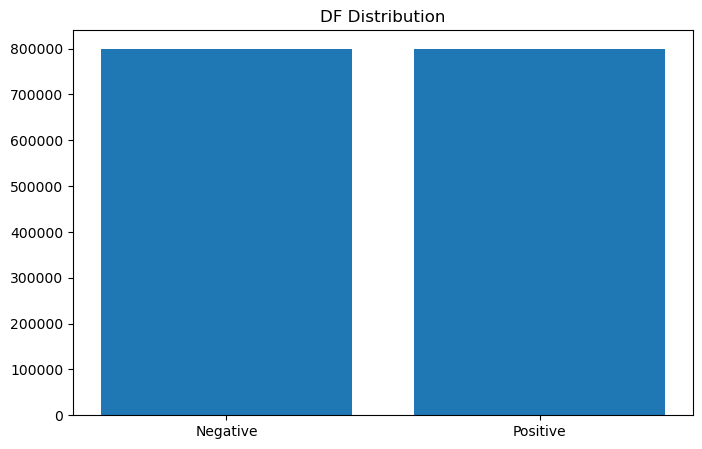

In [8]:
instances = data.label.value_counts()

plt.figure(figsize=(8,5))
plt.bar(instances.index, instances.values)
plt.title("DF Distribution")

In [9]:
## preprocessing

In [10]:
stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')
punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)

In [11]:
data.tweet = data.tweet.apply(lambda tw: preprocess(tw))

In [12]:
# Removing the tweets which length is 0
data = data[data.iloc[:,1].astype(str).str.len()!=0]

In [13]:
data

,label,tweet
0,Negative,awww bummer shoulda got david carr third day
1,Negative,upset update facebook texting might cry result...
2,Negative,dived many times ball managed save 50 rest go ...
3,Negative,whole body feels itchy like fire
4,Negative,behaving mad see
...,...,...
1599995,Positive,woke school best feeling ever
1599996,Positive,thewdb com cool hear old walt interviews
1599997,Positive,ready mojo makeover ask details
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...


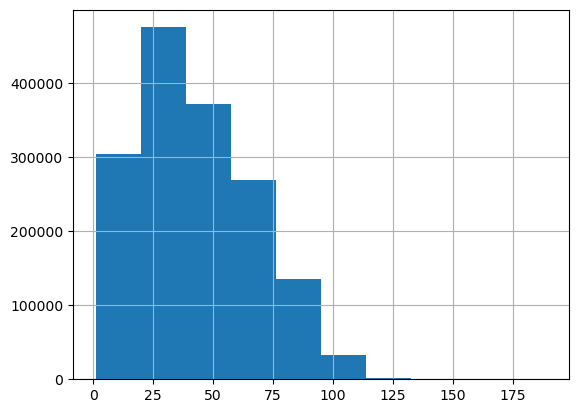

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [14]:
#representation on the fequency of words per tweet
tweets_len = [len(x) for x in data['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

In [15]:
## Counting the number of letters

In [16]:
all_str = ""
for i in data.tweet:
    all_str += i

In [17]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df



,letter,frequency,all_tweets_relative_freq
0,a,4547601,0.078816
1,b,975326,0.016904
2,c,1705409,0.029557
3,d,2289515,0.039680
4,e,6471295,0.112156
5,f,878849,0.015232
6,g,2231747,0.038679
7,h,2234047,0.038719
8,i,3779579,0.065505
9,j,143817,0.002493


In [18]:
data1 = data.copy()

data1['number_of_characters'] = [len(tw) for tw in data1.tweet]
data1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [19]:
#maximum number of letters per tweet
data1.number_of_characters.max()


189

In [20]:
##minimum number of letters per tweet
data1.number_of_characters.min()


1

In [21]:
#mean of the letters per tweet
data1.number_of_characters.mean()


42.7974010379771

In [22]:
#standard deviation of the character count
data1.number_of_characters.std()

24.15896165070398

In [23]:
#Counting the nnumber of words

In [24]:
data1['number_of_words'] = [len(tw.split()) for tw in data1.tweet]
data1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [25]:
#maximum number of words per tweet
data1.number_of_words.max()

50

In [26]:
##minimum number of words per tweet
data1.number_of_words.min()

1

In [27]:
#mean of the wordss per tweet
data1.number_of_words.mean()

7.244474128445898

In [28]:
#standard deviation of the word count
data1.number_of_words.std()

4.030421805717334

In [29]:
#most used words in positive + Negative tweets

<BarContainer object of 20 artists>

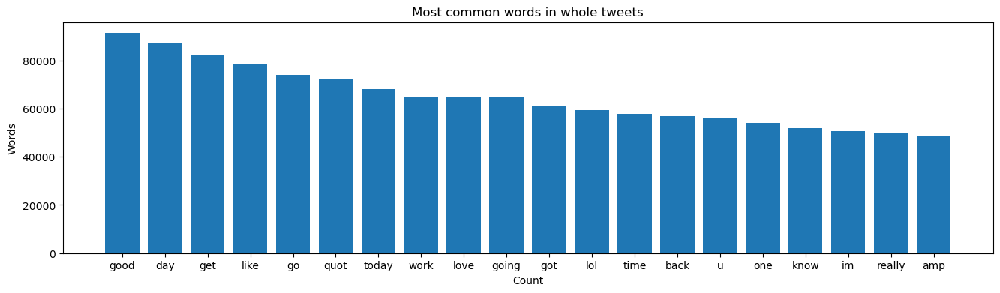

In [30]:
import collections
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(data['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

In [31]:
#most used words in positive comments

<BarContainer object of 20 artists>

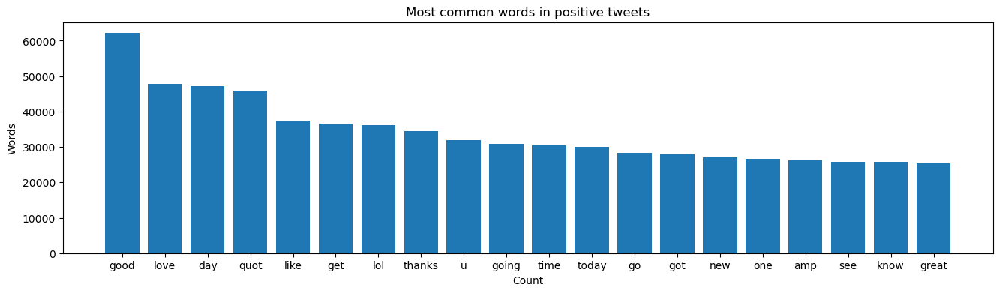

In [32]:
all_tweets = ' '.join(data[data.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

In [33]:
##word cloud of the words used

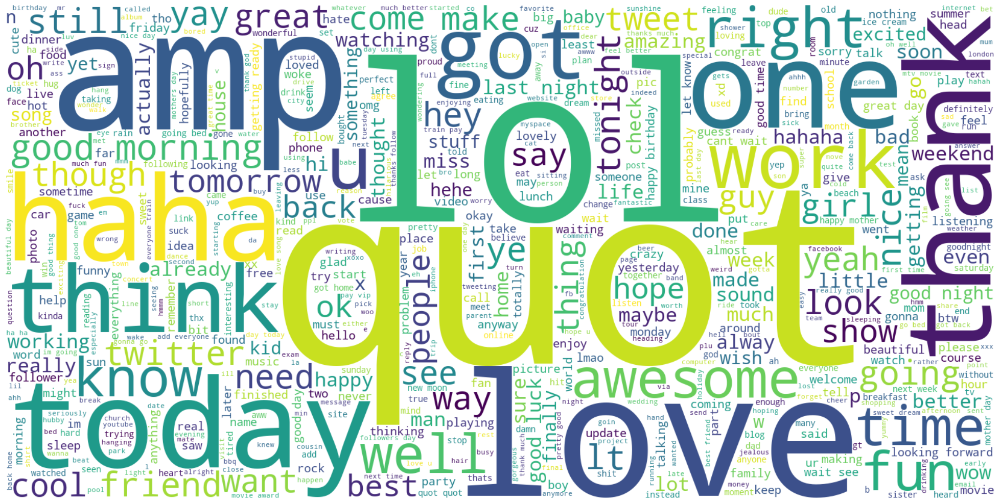

In [34]:
from wordcloud import WordCloud
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words=2000 ,width=1600 ,height=800,background_color='white',min_font_size=10).generate(" ".join(data[data.label=='Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation='bilinear')

In [35]:
#most used words in negative comments

<BarContainer object of 20 artists>

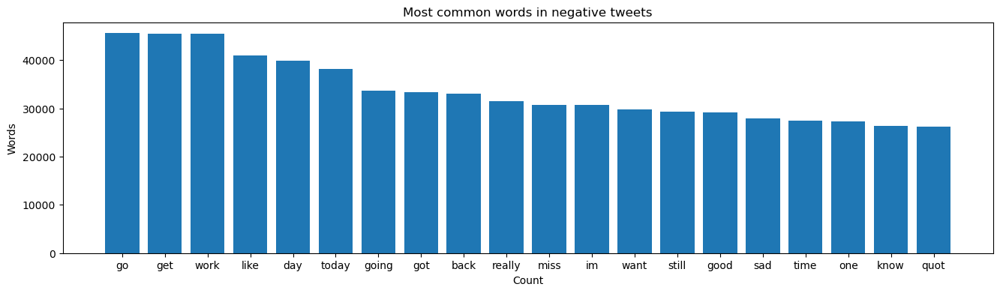

In [36]:
all_tweets=' '.join(data[data.label == 'Negative'].tweet.str.lower())

f_words=[word for word in all_tweets.split()]
counted_words=collections.Counter(f_words)

words=[]
counts=[]
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

In [37]:
##word cloud of the words used

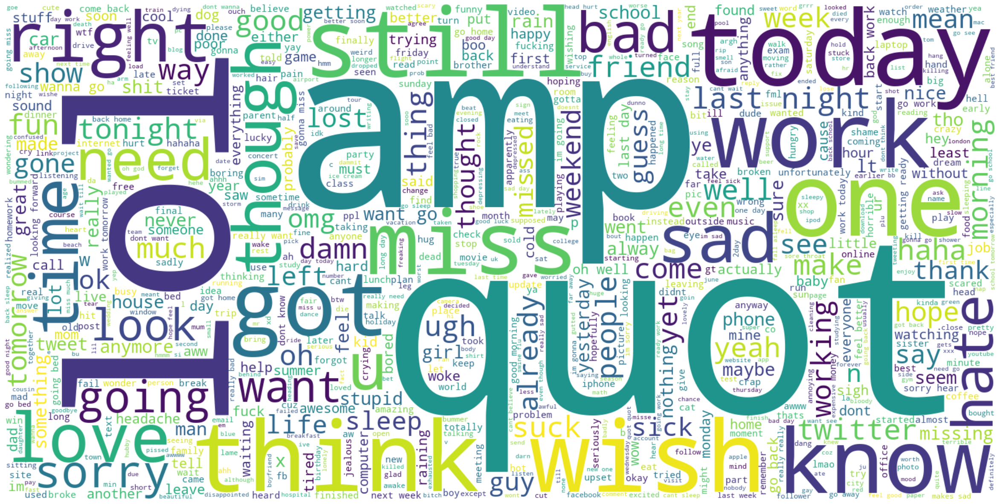

In [38]:
plt.figure(figsize=(30,30))
plt.axis('off')
wordcloud_fig=WordCloud(max_words=2000 ,width=1600 ,height=800,background_color='white',min_font_size=10).generate(" ".join(data[data.label=='Negative'].tweet))
plt.imshow(wordcloud_fig ,interpolation='bilinear')

In [39]:
#Performing the train/test data split

In [40]:
from sklearn.model_selection import train_test_split

train_data ,test_data=train_test_split(data ,test_size=0.2, random_state=42)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head()

Training Data 1273862 Test Data 318466


,label,tweet
1314351,Positive,well good luck
1296825,Positive,hahahaha nice tom must really weard see tv
1547827,Positive,lt 3 life
41318,Negative,class bored hungry
1343771,Positive,walkinq around santa monica w tha cuzzo tina


In [41]:
test_data.head()

,label,tweet
1589563,Positive,need buy copy lines vines trying times walmart...
1343583,Positive,really awesome could skiing stuff pshh love ho...
926114,Positive,always
1079667,Positive,whoo mike fave heard new cd
1559599,Positive,want palm pre lol


In [42]:
# tokenization

In [43]:
from keras.preprocessing.text import Tokenizer

tokenizer=Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index=tokenizer.word_index
vocab_size=len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 290266


In [64]:
from keras_preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [65]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


In [44]:
MODELS_PATH = 'models'
EMBEDDING_DIMENSION = 300

In [45]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('glove.6B.300d.txt/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


In [46]:
#Feature extraction

In [47]:
#using continus BOW

In [48]:
from sklearn.feature_extraction.text import CountVectorizer

K=20000
shuffled_data=data.sample(frac=1).reset_index(drop=True)
first_K_tweets=shuffled_data['tweet'].head(K)

vectorizer=CountVectorizer(stop_words='english')
vec=vectorizer.fit(first_K_tweets)
vec=vectorizer.transform(first_K_tweets)
#Dictionary
vectorizer.get_feature_names_out()

array(['00', '000', '001', ..., 'zzzzzz', 'zzzzzzz', 'zzzzzzzs'],
      dtype=object)

In [49]:
#Transforming each tweet in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [50]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

maybe ask raise
[0 0 0 ... 0 0 0]
best way start day peaceful quiet beautiful
[0 0 0 ... 0 0 0]
going work
[0 0 0 ... 0 0 0]
asprin drink water be4 alcohl blood thinner
[0 0 0 ... 0 0 0]
night museum
[0 0 0 ... 0 0 0]
ican get fact gorg leighton also fucking hear anything english translating commenting
[0 0 0 ... 0 0 0]
whereeee lixieee live oh right te middle ocean
[0 0 0 ... 0 0 0]
stuck major question idea find answer
[0 0 0 ... 0 0 0]
damn charming skater look kind hot hot mess catherine pls hate hitting friends tnx
[0 0 0 ... 0 0 0]
im watching get emm
[0 0 0 ... 0 0 0]
got bad news cries go
[0 0 0 ... 0 0 0]
many unreal people ask question everyday hope everythings good
[0 0 0 ... 0 0 0]
yes followfriday great little invention whose invention exactly idea pure genius
[0 0 0 ... 0 0 0]
done nurse said immune 2 everything immunised 4
[0 0 0 ... 0 0 0]
whoo h1n1 hysteria think heard teachers confirmed fuji shi live finding news
[0 0 0 ... 0 0 0]
get 100 followers day using www tweet

[0 0 0 ... 0 0 0]
birthday party great love friends lt 3 totally lost camera ashtons part missing camera come back
[0 0 0 ... 0 0 0]
diane going back korea sad
[0 0 0 ... 0 0 0]
psyche employees wish good weekend leave monday evening
[0 0 0 ... 0 0 0]
trying find motivation believe rain washed away could never live forks even edward
[0 0 0 ... 0 0 0]
guess get read comment today quot rise fall english quot robert scholes heard quite dry
[0 0 0 ... 0 0 0]
must talkin bout bachelorette w ya sucked lol
[0 0 0 ... 0 0 0]
bored lonely n missing friendly faces
[0 0 0 ... 0 0 0]
guys gals awesome expect new album bout new single song
[0 0 0 ... 0 0 0]
oh gosh go eat sea food place dont like changed thier minds go olive garden ugh
[0 0 0 ... 0 0 0]
sad bf denied us visa anybody help
[0 0 0 ... 0 0 0]
start day 1 dae dae workout plan juice
[0 0 0 ... 0 0 0]
much delayed ff coming way 6 34am saturday morning
[0 0 0 ... 0 0 0]
pics
[0 0 0 ... 0 0 0]
damn eyelid hurts
[0 0 0 ... 0 0 0]
congratulat

[0 0 0 ... 0 0 0]
gmail spam filter circumnavigated
[0 0 0 ... 0 0 0]
morning world
[0 0 0 ... 0 0 0]
jk rowling writes books make journalist
[0 0 0 ... 0 0 0]
finally remove hero even optimization need somethibg take 30 secs get dialer roger rom ni
[0 0 0 ... 0 0 0]
laying pool cloud sky
[0 0 0 ... 0 0 0]
got iphone chillin watchin hills reruns going disneyland tomorrow
[0 0 0 ... 0 0 0]
hmm could fit couch see clothesline snake reach reach get oh two legs halp
[0 0 0 ... 0 0 0]
yay three followers good know one person big wide world likes fishies
[0 0 0 ... 0 0 0]
welcome 2 world u shld hear 3am merengue btw hey miss lady
[0 0 0 ... 0 0 0]
hate plane feels like air slightly claustrophobic
[0 0 0 ... 0 0 0]
wishing nicer today could take babies jones beach walk gonna happen watch yo gabba gabba instead
[0 0 0 ... 0 0 0]
congratulations diversity susan boyle
[0 0 0 ... 0 0 0]
needs clear mess
[0 0 0 ... 0 0 0]
think got best text ever day made
[0 0 0 ... 0 0 0]
hey babygirl checking mo

[0 0 0 ... 0 0 0]
uuuggghhh back pains effin killin
[0 0 0 ... 0 0 0]
3 0 drying batterie
[0 0 0 ... 0 0 0]
back enjoy analysing poker situations damn much quit long time
[0 0 0 ... 0 0 0]
play music wily castle stage 1 megaman 2 guitar makes happy
[0 0 0 ... 0 0 0]
fever
[0 0 0 ... 0 0 0]
one last view beach sad leave
[0 0 0 ... 0 0 0]
woowwww new york
[0 0 0 ... 0 0 0]
heh sounds much better tell rest story
[0 0 0 ... 0 0 0]
super psyched bensales ben grubb loved joes seriously brings smile face
[0 0 0 ... 0 0 0]
liked song good see twitter
[0 0 0 ... 0 0 0]
better start past papers start easiest english get harder stuff ie geography
[0 0 0 ... 0 0 0]
ahh joy drinking diet coke
[0 0 0 ... 0 0 0]
dislike hair frizzy
[0 0 0 ... 0 0 0]
sorting old clothing little sister lesley giving bags bags stuff 2 charity bullying hates haha
[0 0 0 ... 0 0 0]
lesleychang last time programmed perl 97 ugly code
[0 0 0 ... 0 0 0]
going work
[0 0 0 ... 0 0 0]
good luck album cant wait hear see tour
[0 0

[0 0 0 ... 0 0 0]
lol funny never got shirt offers quot fanned quot captain sullenberger
[0 0 0 ... 0 0 0]
need followers 44 feel like one likes anymore
[0 0 0 ... 0 0 0]
chesterday make top
[0 0 0 ... 0 0 0]
nah would play ps2 going ps3 fml
[0 0 0 ... 0 0 0]
sitting cutest cafe vermont long trip well worth
[0 0 0 ... 0 0 0]
back pain writing lyrics new songs gash asleep next twitching sexy lol
[0 0 0 ... 0 0 0]
maybe except shooting house ups odds believe drug dealers suburbs
[0 0 0 ... 0 0 0]
forgive phil
[0 0 0 ... 0 0 0]
yeah tried didnt shows wanted full reviews lol
[0 0 0 ... 0 0 0]
fuck hurry
[0 0 0 ... 0 0 0]
reading lol
[0 0 0 ... 0 0 0]
believe waited long buy dr horrible dvd shame shame call fan
[0 0 0 ... 0 0 0]
wonderng thought tired cuz see quot mantis quot infomercial sleep sheesh
[0 0 0 ... 0 0 0]
hey matt
[0 0 0 ... 0 0 0]
taking day lot nothing soon go bank take car shop
[0 0 0 ... 0 0 0]
hate keanudy freaknig suck greeted
[0 0 0 ... 0 0 0]
nice
[0 0 0 ... 0 0 0]
down

[0 0 0 ... 0 0 0]
thanks kind words article jhorneman dgou recodingjim amp simontarr
[0 0 0 ... 0 0 0]
thanks working alot job get online tired today tuesday r u
[0 0 0 ... 0 0 0]
pictures
[0 0 0 ... 0 0 0]
want see rafa
[0 0 0 ... 0 0 0]
twitter hard lol
[0 0 0 ... 0 0 0]
mini pet frogs like orange ones x x
[0 0 0 ... 0 0 0]
minigolfing man
[0 0 0 ... 0 0 0]
thank congrats yes still sore lol happy june month going better tell already
[0 0 0 ... 0 0 0]
bored witha headache work
[0 0 0 ... 0 0 0]
kat10187 guys make
[0 0 0 ... 0 0 0]
sleep awful wrong
[0 0 0 ... 0 0 0]
et tu brute fox nation opinion site expect stuff like like expect anti cons liberal site
[0 0 0 ... 0 0 0]
coz hungry didnt eat cake
[0 0 0 ... 0 0 0]
seriously cannot ask
[0 0 0 ... 0 0 0]
used loads mobile stuff bosch sold siemens shut moro shut
[0 0 0 ... 0 0 0]
feeling right hate damn humprey
[0 0 0 ... 0 0 0]
mine best world
[0 0 0 ... 0 0 0]
emailed link potential job check gmail let know pursue know people know peop

[0 0 0 ... 0 0 0]
need maid french maid outfit
[0 0 0 ... 0 0 0]
u heard true sharepoint 2010 stuff vegas conference aus teched cover 2007 material
[0 0 0 ... 0 0 0]
beijing good massage amp sexy girl amp 100 real photo 13341015518 w4 beijing hi
[0 0 0 ... 0 0 0]
hi thank posting story
[0 0 0 ... 0 0 0]
disabled despite intense breakdowns last days end well physical shit severely limits
[0 0 0 ... 0 0 0]
donniewahlberg everytime get get guess ddub worthy
[0 0 0 ... 0 0 0]
happy bday mom happy mothers day
[0 0 0 ... 0 0 0]
hey yeah good thanks u studying geography exam sucks wuu2 wb love u xxx
[0 0 0 ... 0 0 0]
still
[0 0 0 ... 0 0 0]
yeah got today
[0 0 0 ... 0 0 0]
attending last week jr year
[0 0 0 ... 0 0 0]
certainly think good quote
[0 0 0 ... 0 0 0]
watching twilight wit viv
[0 0 0 ... 0 0 0]
sprint sucks away twitter weekend
[0 0 0 ... 0 0 0]
responded going
[0 0 0 ... 0 0 0]
plus target practice fun hunting legal good time enjoying nature
[0 0 0 ... 0 0 0]
major chocolate cravi

[0 0 0 ... 0 0 0]
listening music
[0 0 0 ... 0 0 0]
oh wish happier come drink wine forget men xx
[0 0 0 ... 0 0 0]
got lost shopping centre today mother forgetful even forgets children nonoko
[0 0 0 ... 0 0 0]
shower felt really good ears gross
[0 0 0 ... 0 0 0]
life goal sing theme song james bond movie lol
[0 0 0 ... 0 0 0]
trying look busy
[0 0 0 ... 0 0 0]
lol ty
[0 0 0 ... 0 0 0]
see would night job vampires amp guess makes even awesome originally thought
[0 0 0 ... 0 0 0]
lose entire bag shopping sainsburys flat car missing limes chillies angel delight
[0 0 0 ... 0 0 0]
watching bb cairon got evicted badd times n
[0 0 0 ... 0 0 0]
yay got hair wet pool woohoo hella heads haha work 530
[0 0 0 ... 0 0 0]
thankyou
[0 0 0 ... 0 0 0]
like sun making feel much happier vitamin people oh yes know physics
[0 0 0 ... 0 0 0]
extremely ominous lady
[0 0 0 ... 0 0 0]
failed cupcakes boring friday night make sad panda
[0 0 0 ... 0 0 0]
feeling bad getting work late
[0 0 0 ... 0 0 0]
know name

In [51]:
#TF-IDF

In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learning vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'maybe': 11832,
 'ask': 1505,
 'raise': 15185,
 'best': 2278,
 'way': 20496,
 'start': 17776,
 'day': 5030,
 'peaceful': 14000,
 'quiet': 15101,
 'beautiful': 2116,
 'going': 7929,
 'work': 20958,
 'asprin': 1528,
 'drink': 5855,
 'water': 20472,
 'be4': 2077,
 'alcohl': 982,
 'blood': 2545,
 'thinner': 18839,
 'night': 13030,
 'museum': 12650,
 'ican': 9221,
 'fact': 6714,
 'gorg': 7998,
 'leighton': 10875,
 'fucking': 7492,
 'hear': 8591,
 'english': 6323,
 'translating': 19308,
 'commenting': 4180,
 'whereeee': 20663,
 'lixieee': 11116,
 'live': 11100,
 'oh': 13370,
 'right': 15793,
 'te': 18570,
 'middle': 12106,
 'ocean': 13323,
 'stuck': 18022,
 'major': 11543,
 'question': 15088,
 'idea': 9251,
 'answer': 1255,
 'damn': 4928,
 'charming': 3629,
 'skater': 17056,
 'look': 11231,
 'kind': 10414,
 'hot': 9005,
 'mess': 12028,
 'catherine': 3440,
 'pls': 14428,
 'hate': 8501,
 'hitting': 8817,
 'friends': 7424,
 'tnx': 19081,
 'im': 9334,
 'watching': 20467,
 'emm': 6262,
 'got': 8

In [53]:
# Transforming to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [54]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

maybe ask raise
  (0, 15185)	0.7394913759148158
  (0, 11832)	0.4485786988389176
  (0, 1505)	0.5019259466251934
best way start day peaceful quiet beautiful
  (0, 20496)	0.30333700768651156
  (0, 17776)	0.3591843852286527
  (0, 15101)	0.45369582860153235
  (0, 14000)	0.5291492225152387
  (0, 5030)	0.23044377504093544
  (0, 2278)	0.3284912870650435
  (0, 2116)	0.3634880650915917
going work
  (0, 20958)	0.7104177888287766
  (0, 7929)	0.7037801967344859
asprin drink water be4 alcohl blood thinner
  (0, 20472)	0.298366114413257
  (0, 18839)	0.4319106873907064
  (0, 5855)	0.3031240562131538
  (0, 2545)	0.3345088179047
  (0, 2077)	0.40258980304167025
  (0, 1528)	0.41475906955853836
  (0, 982)	0.4319106873907064
night museum
  (0, 13030)	0.5034510253775827
  (0, 12650)	0.8640237641675492
ican get fact gorg leighton also fucking hear anything english translating commenting
  (0, 19308)	0.37313149393577943
  (0, 10875)	0.3621836041153718
  (0, 9221)	0.3885616779988893
  (0, 8591)	0.23338888501246

omg wtf yall goin thru tonite orlando
  (0, 21173)	0.4383380386718545
  (0, 21055)	0.3917061771049029
  (0, 19157)	0.45384692921475034
  (0, 13614)	0.44953184075099517
  (0, 13442)	0.3229674436210215
  (0, 7926)	0.3769113344348244
get taylor presale want go
  (0, 20419)	0.3379687631170791
  (0, 18548)	0.5740571497184797
  (0, 14711)	0.7458119763145445
best revenge happiness
  (0, 15717)	0.697396343424419
  (0, 8447)	0.5930999737312184
  (0, 2278)	0.4023316558988092
ust pretty cool plans take college
  (0, 19982)	0.5730013386028134
  (0, 14740)	0.360498179255307
  (0, 14362)	0.46253549315070375
  (0, 4410)	0.3500480842228183
  (0, 4116)	0.453031770432011
may head amp tomorrow take look
  (0, 19133)	0.4568655847890086
  (0, 11231)	0.523192915057324
  (0, 8558)	0.5821804055870898
  (0, 1140)	0.42262156407318885
going meet friend sister
  (0, 17022)	0.55387554735996
  (0, 11932)	0.5728103851596429
  (0, 7929)	0.3498563639762526
  (0, 7421)	0.4926567418348013
new day new week work oh work
 

  (0, 14740)	0.2899160607164645
  (0, 13998)	0.4718768576051356
  (0, 12946)	0.23034806144684025
  (0, 7954)	0.195414305542001
  (0, 6680)	0.4861404956803025
  (0, 2735)	0.3384416491543628
  (0, 2453)	0.3589670885779339
  (0, 978)	0.34971592281141134
aw miss send matt love tomorrow lizeelou2 gonna go harry potter right
  (0, 19133)	0.21385031705228763
  (0, 16525)	0.29365468884021134
  (0, 15793)	0.22172904122504974
  (0, 14616)	0.3772871189317032
  (0, 12242)	0.2098310337433901
  (0, 11801)	0.3648204478381655
  (0, 11313)	0.186617019019681
  (0, 11119)	0.4424661481462437
  (0, 8482)	0.35235377674462787
  (0, 7949)	0.2298966030055129
  (0, 1701)	0.3029765169100194
absolutely already booked table rooms
  (0, 18404)	0.5077530896000975
  (0, 15947)	0.5557812210577657
  (0, 2663)	0.4935076123447104
  (0, 653)	0.4355964541624705
missing buddy
  (0, 12250)	0.6281051349909699
  (0, 3026)	0.7781284851475208
thank bear mind
  (0, 18741)	0.4477314391914467
  (0, 12180)	0.5584548266453893
  (0, 2

  (0, 20673)	0.43854838108253874
  (0, 19133)	0.22072189696881617
  (0, 15318)	0.20194294462292472
  (0, 15300)	0.2569355017328018
  (0, 13370)	0.21230101392385775
  (0, 12858)	0.21513714047007274
  (0, 8558)	0.28126426629093015
  (0, 7765)	0.23533881872701287
  (0, 4790)	0.4566837632485026
  (0, 3682)	0.3494322481451221
  (0, 2828)	0.309269694993544
oooo boy coulndnt sleep like dat head hurts
  (0, 17133)	0.2534668986346043
  (0, 13511)	0.4265562372405004
  (0, 11001)	0.1986963474821988
  (0, 9163)	0.3121371094630601
  (0, 8558)	0.30809408258556215
  (0, 4999)	0.3953966664702999
  (0, 4504)	0.5002468565424965
  (0, 2759)	0.33968675143482735
im soo bored im deffo missing music channels
  (0, 17417)	0.33085809019262313
  (0, 12655)	0.30222511539843144
  (0, 12250)	0.30568475978125925
  (0, 9334)	0.44466254897888324
  (0, 5165)	0.458010385931891
  (0, 3586)	0.458010385931891
  (0, 2694)	0.29745238561257376
work soon cant asked
  (0, 20958)	0.4135817592612761
  (0, 17420)	0.51678227019778

  (0, 18229)	0.43522852292740905
  (0, 16339)	0.2603492029616896
  (0, 10512)	0.2182413111655656
  (0, 10382)	0.32266252510267657
  (0, 7765)	0.2556493543794199
  (0, 5862)	0.33506917683309867
  (0, 4578)	0.4960971159011029
  (0, 255)	0.40904004239086583
hey nadine kinda nervous bout mondaaaay
  (0, 12912)	0.40467826359896203
  (0, 12728)	0.49006413561909556
  (0, 12396)	0.5257558340564019
  (0, 10415)	0.3345357035453869
  (0, 8720)	0.2821047240803644
  (0, 2743)	0.3579891571137726
worry complaining different website madguy000
  (0, 20986)	0.3996196179272882
  (0, 20535)	0.40132541801308946
  (0, 11487)	0.5485857907582669
  (0, 5436)	0.3918192513612101
  (0, 4228)	0.4741027043427774
much wish could hold arms one last time
  (0, 20836)	0.37249309199391534
  (0, 18982)	0.32799141449358804
  (0, 8864)	0.5779705798778493
  (0, 1436)	0.6477812418023314
fathers day sad miss dad
  (0, 16103)	0.36070045198921913
  (0, 12242)	0.3509497704965055
  (0, 6820)	0.6604137083847007
  (0, 5030)	0.28760

nice tie smart
  (0, 18944)	0.6820884121626706
  (0, 17210)	0.6134968283076956
  (0, 12998)	0.3979661287720409
great list post globe summer reading list least 2 listed make way ducklings amp charlottes web
  (0, 20526)	0.26309581642882823
  (0, 20496)	0.1759035297643267
  (0, 18144)	0.1971302516850429
  (0, 15298)	0.22930832803394974
  (0, 14595)	0.22134763202328375
  (0, 11549)	0.1736798650404033
  (0, 11072)	0.3301934637599133
  (0, 11070)	0.4736459480106007
  (0, 8116)	0.1635376121594921
  (0, 7876)	0.3301934637599133
  (0, 5934)	0.34384802255501773
  (0, 3626)	0.34384802255501773
  (0, 1140)	0.1537303403007281
hope u prayed need
  (0, 14665)	0.8305453290625278
  (0, 12858)	0.3912579371210515
  (0, 8963)	0.39637316131670264
yaaayyyy audition today agt americas got talent amp sick
  (0, 21158)	0.41810224509642624
  (0, 19089)	0.17642496364849555
  (0, 18451)	0.34947249152782783
  (0, 16901)	0.2369376414502765
  (0, 8010)	0.18457453887504055
  (0, 1620)	0.40583488791169997
  (0, 1140)

fucking blah 12v 5v rail incident blew half 128x64 lcd time get new one 2 weeks shipping
  (0, 20569)	0.20148357983513576
  (0, 18982)	0.13747253580756455
  (0, 16758)	0.27934477616244874
  (0, 15168)	0.30576787019445095
  (0, 12946)	0.14488205935911022
  (0, 10800)	0.31841235235252224
  (0, 9414)	0.30576787019445095
  (0, 8377)	0.2053868087351867
  (0, 7492)	0.23098919408273477
  (0, 2512)	0.2967964673300074
  (0, 2467)	0.2555773394648188
  (0, 441)	0.31841235235252224
  (0, 83)	0.31841235235252224
  (0, 73)	0.31841235235252224
difference
  (0, 5434)	1.0
really wish nj everyone else
  (0, 20836)	0.44168997630197415
  (0, 15318)	0.39833537196302565
  (0, 13077)	0.8038898533240978
tune fox news 6am today locash fox friends
  (0, 19476)	0.3399909563186866
  (0, 19089)	0.1570349049420415
  (0, 12963)	0.25100248647493034
  (0, 11160)	0.3875401633322873
  (0, 7424)	0.22028106403862774
  (0, 7324)	0.6916836355821326
  (0, 465)	0.3458418177910663
wake lady gaga poke face bahahahahaha thanks s

cant tell twitter
  (0, 19593)	0.6493401233377265
  (0, 18633)	0.7604981290073934
ok read u dont like star wars sad
  (0, 20444)	0.5706249640997106
  (0, 17761)	0.43661960446319853
  (0, 16103)	0.2896277836811627
  (0, 15293)	0.36315992857990004
  (0, 13396)	0.3267963246429879
  (0, 11001)	0.23602300862258982
  (0, 5719)	0.32477436188677106
one told birthday
  (0, 19109)	0.7516233009961246
  (0, 2406)	0.65959261169277
btw pleeeeeease call amp ask wtf going tatiiz89
  (0, 21055)	0.37436940907724847
  (0, 18531)	0.526078087169289
  (0, 14421)	0.4903645121113526
  (0, 7929)	0.22001790566548468
  (0, 3002)	0.3483216270370149
  (0, 1505)	0.3428930531502266
  (0, 1140)	0.23520322369267238
anyone able join bt openzone using 3gs beginning wonder dud phone
  (0, 20895)	0.29378516650036857
  (0, 19980)	0.2662026744978037
  (0, 14187)	0.22380156662053907
  (0, 13545)	0.396186671331184
  (0, 10031)	0.29378516650036857
  (0, 5937)	0.396186671331184
  (0, 2994)	0.3337367721510684
  (0, 2176)	0.32068

  (0, 20142)	0.5260302281101642
  (0, 19938)	0.3064207531865169
  (0, 17420)	0.2774862896250725
  (0, 14797)	0.3316609410591066
  (0, 11001)	0.208937414845781
  (0, 8591)	0.31595912662759634
  (0, 7949)	0.27331483555838315
  (0, 3454)	0.3265893960860956
  (0, 1754)	0.3428618590379751
homework lie sun met attractive boy named colby work today
  (0, 20958)	0.18254231369432475
  (0, 19089)	0.17520981441508163
  (0, 18155)	0.2515786074675528
  (0, 12757)	0.3686980834189685
  (0, 12037)	0.3099907895818695
  (0, 10965)	0.35651521920717955
  (0, 8905)	0.30246628297349365
  (0, 4088)	0.4323932957510392
  (0, 2759)	0.29361158806880294
  (0, 1605)	0.385868866125729
number 2 megan fox still best
  (0, 13236)	0.4824114260109401
  (0, 11943)	0.5520754602223349
  (0, 7324)	0.5777863824959407
  (0, 2278)	0.35868481773925537
chilling flat drinking hot chocolate
  (0, 9005)	0.37448302840962494
  (0, 7102)	0.5018063988209895
  (0, 5857)	0.4554136076224953
  (0, 3793)	0.4110883478509862
  (0, 3759)	0.481

  (0, 21198)	0.42074958577985194
  (0, 20561)	0.22001012402372855
  (0, 18921)	0.3921863890247874
  (0, 18144)	0.24121840551777046
  (0, 16339)	0.22080720849440033
  (0, 15300)	0.2367185230261615
  (0, 8377)	0.2713978087266593
  (0, 7959)	0.33505999551465837
  (0, 7765)	0.21682117575839824
  (0, 7408)	0.37547799002235444
  (0, 5039)	0.2201683122498881
  (0, 1140)	0.18811210988708685
watching england game eating cookies studio
  (0, 20467)	0.29760156800948695
  (0, 18029)	0.4587427499143183
  (0, 7619)	0.35099901871788014
  (0, 6322)	0.48241036932973946
  (0, 6071)	0.37644911347843363
  (0, 4406)	0.450948317995394
idea every woman apparently like carrot cake wrong chocolate one
  (0, 21043)	0.3167391697478959
  (0, 20891)	0.3938075587929737
  (0, 11001)	0.20196492065813992
  (0, 9251)	0.3273246988069916
  (0, 3793)	0.33435039259021043
  (0, 3393)	0.4739573339915732
  (0, 3222)	0.3568591863630181
  (0, 1331)	0.3645358679171268
got twitter account
  (0, 19593)	0.5110096711463854
  (0, 801

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  (0, 21266)	0.33913643483608913
  (0, 20241)	0.28269768795195377
  (0, 17149)	0.2042537859307671
  (0, 15117)	0.5399301716015531
  (0, 12470)	0.13451942388496174
  (0, 10855)	0.16334349073479962
  (0, 7954)	0.10912361677509512
  (0, 7142)	0.28269768795195377
  (0, 6678)	0.4255343868104648
  (0, 5340)	0.28269768795195377
  (0, 5030)	0.109867656900109
  (0, 1843)	0.1378626466150228
  (0, 1239)	0.20771920986121187
oh cool gonna van thats cool live victoria well ur pree awesome girl
  (0, 20161)	0.3555202513557179
  (0, 20048)	0.36090019216983277
  (0, 19938)	0.23963151890051057
  (0, 18758)	0.24675085391164936
  (0, 14687)	0.41137364633032064
  (0, 13370)	0.1912374584904139
  (0, 11100)	0.23934878294741205
  (0, 7949)	0.21374155797806624
  (0, 7820)	0.2434999212406947
  (0, 4410)	0.4575130727821711
  (0, 1729)	0.21831947707423513
took phone charms
  (0, 19168)	0.5200869548975258
  (0, 14187)	0.442672284835478
  (0, 3630)	0.7304456226057875
know gonna get 3rd aaaah damage control want hid

  (0, 11313)	0.3599275882013027
  (0, 9334)	0.3770805630047732
  (0, 3741)	0.8533829036579047
mall shopping new clothes wasting time
  (0, 20459)	0.5511582961149526
  (0, 18982)	0.2552898600172742
  (0, 16815)	0.38377239019769527
  (0, 12946)	0.2690495264055966
  (0, 11577)	0.46405484413121256
  (0, 4004)	0.4427593324790012
hey gilbirmingham great see looking forward et2 uk wish could x x
  (0, 20836)	0.24570967765322785
  (0, 19722)	0.36353165601556625
  (0, 11235)	0.28221789813746717
  (0, 8720)	0.2688850999020684
  (0, 8116)	0.23833707195490791
  (0, 7807)	0.5011185488835658
  (0, 7305)	0.3106142148474079
  (0, 6471)	0.5011185488835658
simba marty kittens went yesterday barker going today sad
  (0, 21266)	0.2696535283121119
  (0, 20603)	0.2542091486037063
  (0, 19089)	0.18216434945387971
  (0, 16964)	0.44955611471686496
  (0, 16103)	0.2191166116616358
  (0, 11736)	0.4317037788084392
  (0, 10466)	0.3943978658811853
  (0, 7929)	0.18801466408025505
  (0, 1974)	0.44955611471686496
hello

In [55]:
#scatter plot that shows correlation of words in the corpus

In [56]:
##Naive Bayes using TF-IDF

In [57]:
##LSTM

In [58]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [59]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x=SpatialDropout1D(0.2)(embedding_sequences)
x=Conv1D(64, 5, activation='relu')(x)
x=Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2))(x)
x=Dense(512, activation='relu')(x)
x=Dropout(0.5)(x)
x=Dense(512, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)

model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [66]:
history = model.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 626s 247ms/step - loss: 0.5143 - accuracy: 0.7435 - val_loss: 0.4798 - val_accuracy: 0.7695 - lr: 0.0010
Epoch 2/10
2489/2489 [==============================] - 642s 258ms/step - loss: 0.4845 - accuracy: 0.7647 - val_loss: 0.4688 - val_accuracy: 0.7757 - lr: 0.0010
Epoch 3/10
2489/2489 [==============================] - 639s 257ms/step - loss: 0.4743 - accuracy: 0.7715 - val_loss: 0.4629 - val_accuracy: 0.7787 - lr: 0.0010
Epoch 4/10
2489/2489 [==============================] - 632s 254ms/step - loss: 0.4684 - accuracy: 0.7750 - val_loss: 0.4612 - val_accuracy: 0.7802 - lr: 0.0010
Epoch 5/10
2489/2489 [==============================] - 632s 254ms/step - loss: 0.4644 - accuracy: 0.7778 - val_loss: 0.4639 - val_accuracy: 0.7802 - lr: 0.0010
Epoch 6/10
2489/2489 [==============================] - 633s 254ms/step - loss: 0.4605 - accuracy: 0.7804 - val_loss: 0.4575 - val_accuracy: 0.7825 - lr: 0.0010
Epoch 7/10
2489/2489 [============

In [67]:
model.save('models/lstm_model.h5')

In [69]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

model = tf.keras.models.load_model('models/lstm_model.h5')

# Check its architecture
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 30)]              0         
                                                                 
 embedding (Embedding)       (None, 30, 300)           87079800  
                                                                 
 spatial_dropout1d (SpatialD  (None, 30, 300)          0         
 ropout1D)                                                       
                                                                 
 conv1d (Conv1D)             (None, 26, 64)            96064     
                                                                 
 bidirectional (Bidirectiona  (None, 128)              66048     
 l)                                                              
                                                                 
 dense (Dense)               (None, 512)               66048 

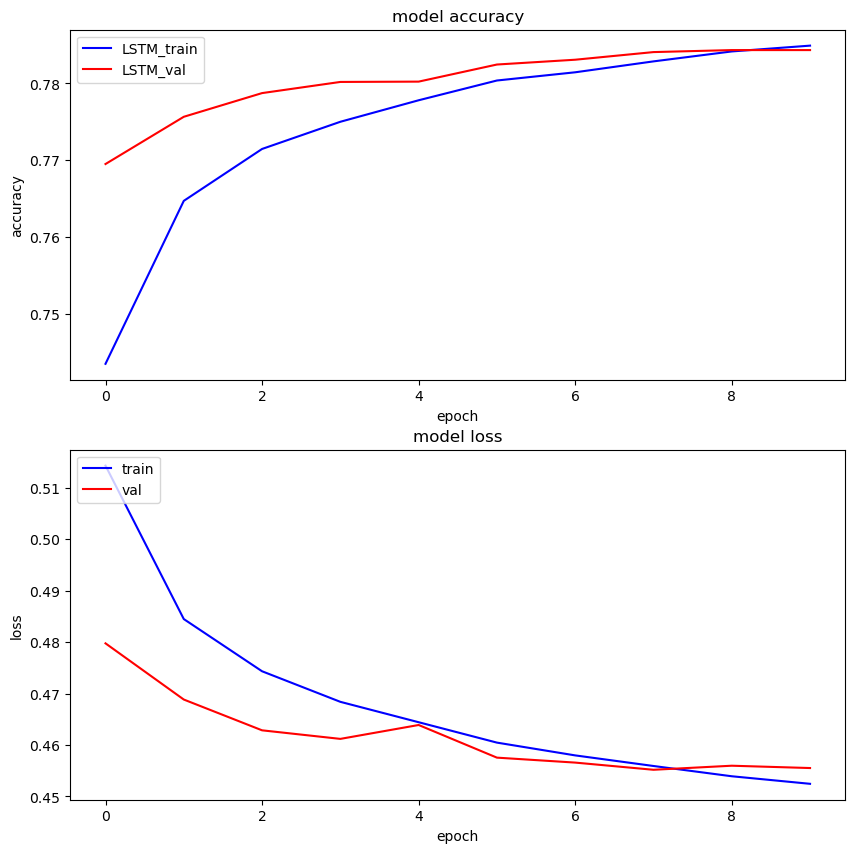

In [70]:
import matplotlib.pyplot as plt

plt1, (plt2, plt3) = plt.subplots(2,1, figsize=(10,10))
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['LSTM_train', 'LSTM_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')
plt3.legend(['train', 'val'], loc='upper left')

In [71]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 20s 582ms/step


In [ ]:
#confusion matrix

[[121967  36573]
 [ 32109 127817]]


<Axes: >

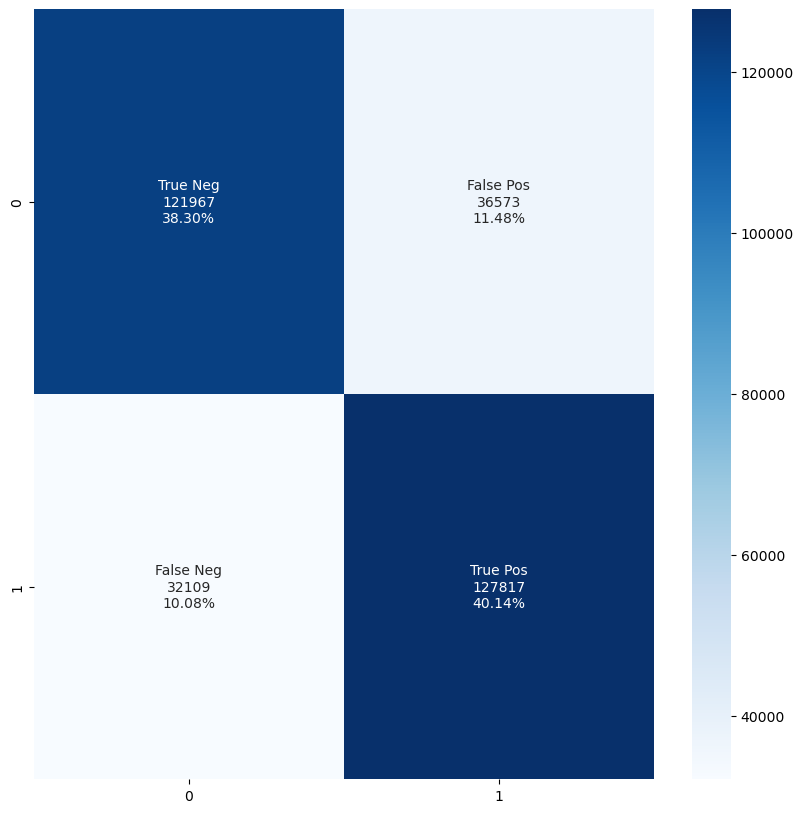

In [73]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)

plt.figure(figsize = (10,10))

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')